In [1]:
library(Seurat)
library(patchwork)
library(cowplot)
library(data.table)
library(dplyr)

The legacy packages maptools, rgdal, and rgeos, underpinning this package
will retire shortly. Please refer to R-spatial evolution reports on
https://r-spatial.org/r/2023/05/15/evolution4.html for details.
This package is now running under evolution status 0 

Attaching SeuratObject


Attaching package: ‘cowplot’


The following object is masked from ‘package:patchwork’:

    align_plots



Attaching package: ‘dplyr’


The following objects are masked from ‘package:data.table’:

    between, first, last


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [49]:
FT1 <- read.csv("/node200data/FTC/data/cellranger_multi_outs/FT1/outs/per_sample_outs/FT1/vdj_t/filtered_contig_annotations.csv")
FT2 <- read.csv("/node200data/FTC/data/cellranger_multi_outs/FT2/outs/per_sample_outs/FT2/vdj_t/filtered_contig_annotations.csv")
FT3 <- read.csv("/node200data/FTC/data/cellranger_multi_outs/FT3/outs/per_sample_outs/FT3/vdj_t/filtered_contig_annotations.csv")
FT4 <- read.csv("/node200data/FTC/data/cellranger_multi_outs/FT4/outs/per_sample_outs/FT4/vdj_t/filtered_contig_annotations.csv")
FT5 <- read.csv("/node200data/FTC/data/cellranger_multi_outs/FT5/outs/per_sample_outs/FT5/vdj_t/filtered_contig_annotations.csv")

In [50]:
file_list <- list.files("/home/jurny0402/TCR_explore/data/filtered_contig_annotations")

meta.info=data.table(file_path = file_list)
meta.info$sampleID <- c("FT1", 'FT2', 'FT3', 'FT4','FT5')
DT::datatable(meta.info)

HTML widgets cannot be represented in plain text (need html)

In [51]:
sample_paths = c("/node200data/FTC/data/cellranger_multi_outs/FT1/outs/per_sample_outs/FT1/vdj_t/filtered_contig_annotations.csv",
                "/node200data/FTC/data/cellranger_multi_outs/FT2/outs/per_sample_outs/FT2/vdj_t/filtered_contig_annotations.csv",
                "/node200data/FTC/data/cellranger_multi_outs/FT3/outs/per_sample_outs/FT3/vdj_t/filtered_contig_annotations.csv",
                "/node200data/FTC/data/cellranger_multi_outs/FT4/outs/per_sample_outs/FT4/vdj_t/filtered_contig_annotations.csv",
                "/node200data/FTC/data/cellranger_multi_outs/FT5/outs/per_sample_outs/FT5/vdj_t/filtered_contig_annotations.csv")

In [52]:
batch_list = list()

In [63]:
for(i in 1:5) {
  dir_of_10X = meta.info$file_path[i]
  sampleID = meta.info$sampleID[i]
  meta_mat = read.csv(sample_paths[i])
  FT <- CreateSeuratObject(counts = meta_mat, project = sampleID, min.cells = 3, min.features = 200)
  FT@meta.data[,'SampleID'] = sampleID
  batch_list <- append(batch_list, FT)
  print(paste("Finishing processing", sampleID, 'at', Sys.time()))
}

ERROR: Error in matrix(data = as.numeric(x = x), ncol = nc): (converted from warning) NAs introduced by coercion


In [60]:
read.csv(sample_paths[1])

barcode,is_cell,contig_id,high_confidence,length,chain,v_gene,d_gene,j_gene,c_gene,⋯,fwr3_nt,cdr3,cdr3_nt,fwr4,fwr4_nt,reads,umis,raw_clonotype_id,raw_consensus_id,exact_subclonotype_id
<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<int>
AAACCTGCACCGGAAA-1,true,AAACCTGCACCGGAAA-1_contig_1,true,485,TRB,TRBV24-1,,TRBJ1-5,TRBC1,⋯,ATAAACAAAGGAGAGATCTCTGATGGATACAGTGTCTCTCGACAGGCACAGGCTAAATTCTCCCTGTCCCTAGAGTCTGCCATCCCCAACCAGACAGCTCTTTACTTC,CATSDKYLNQPQHF,TGTGCCACCAGTGATAAATACCTCAATCAGCCCCAGCATTTT,GDGTRLSIL,GGTGATGGGACTCGACTCTCCATCCTAG,1673,3,clonotype34,clonotype34_consensus_1,1
AAACCTGCACCGGAAA-1,true,AAACCTGCACCGGAAA-1_contig_2,true,517,TRA,TRAV29/DV5,,TRAJ44,TRAC,⋯,AATGAAGATGGAAGATTCACTGTCTTCTTAAACAAAAGTGCCAAGCACCTCTCTCTGCACATTGTGCCCTCCCAGCCTGGAGACTCTGCAGTGTACTTC,CAAIRYTGTASKLTF,TGTGCAGCAATCCGCTATACCGGCACTGCCAGTAAACTCACCTTT,GTGTRLQVTL,GGGACTGGAACAAGACTTCAGGTCACGCTCG,1851,2,clonotype34,clonotype34_consensus_2,1
AAACCTGGTACTCAAC-1,true,AAACCTGGTACTCAAC-1_contig_1,true,667,TRA,TRAV8-2,,TRAJ22,TRAC,⋯,AAAGGCATCAACGGTTTTGAGGCTGAATTTAAGAAGAGTGAAACCTCCTTCCACCTGACGAAACCCTCAGCCCATATGAGCGACGCGGCTGAGTACTTC,CVVSEGGSARQLTF,TGTGTTGTGAGTGAGGGTGGTTCTGCAAGGCAACTGACCTTT,GSGTQLTVLP,GGATCTGGGACACAATTGACTGTTTTACCTG,935,3,clonotype35,clonotype35_consensus_3,4
AAACCTGGTCTCTTAT-1,true,AAACCTGGTCTCTTAT-1_contig_1,true,484,TRB,TRBV4-2,,TRBJ2-7,TRBC2,⋯,ACTGAAAACAACAGTGTGCCAAGTCGCTTCTCACCTGAATGCCCCAACAGCTCTCACTTATTCCTTCACCTACACACCCTGCAGCCAGAAGACTCGGCCCTGTATCTC,CASSQEIKRELIEQYF,TGTGCCAGCAGCCAAGAAATAAAACGGGAGTTGATCGAGCAGTACTTC,GPGTRLTVT,GGGCCGGGCACCAGGCTCACGGTCACAG,2990,4,clonotype1089,clonotype1089_consensus_2,1
AAACCTGGTCTCTTAT-1,true,AAACCTGGTCTCTTAT-1_contig_2,true,506,TRA,TRAV17,,TRAJ40,TRAC,⋯,AAACACAGTGGAAGATTAAGAGTCACGCTTGACACTTCCAAGAAAAGCAGTTCCTTGTTGATCACGGCTTCCCGGGCAGCAGACACTGCTTCTTACTTC,CATDAPSGTYKYIF,TGTGCTACGGACGCTCCCTCAGGAACCTACAAATACATCTTT,GTGTRLKVLA,GGAACAGGCACCAGGCTGAAGGTTTTAGCAA,2888,6,clonotype1089,clonotype1089_consensus_3,1
AAACCTGGTCTCTTAT-1,true,AAACCTGGTCTCTTAT-1_contig_3,true,514,TRB,TRBV11-2,TRBD1,TRBJ2-1,TRBC2,⋯,GTGGATGATTCACAGTTGCCTAAGGATCGATTTTCTGCAGAGAGGCTCAAAGGAGTAGACTCCACTCTCAAGATCCAGCCTGCAAAGCTTGAGGACTCGGCCGTGTATCTC,CASRDRQGANEQFF,TGTGCCAGCAGGGACCGACAGGGGGCTAATGAGCAGTTCTTC,GPGTRLTVL,GGGCCAGGGACACGGCTCACCGTGCTAG,5193,10,clonotype1089,clonotype1089_consensus_1,1
AAACCTGGTCTTGTCC-1,true,AAACCTGGTCTTGTCC-1_contig_1,true,474,TRA,TRAV30,,TRAJ23,TRAC,⋯,AAGGGTCATGAAAAAATATCTGCTTCATTTAATGAAAAAAAGCAGCAAAGCTCCCTGTACCTTACGGCCTCCCAGCTCAGTTACTCAGGAACCTACTTC,CGTEIYNQGGKLIF,TGCGGCACAGAGATCTATAACCAGGGAGGAAAGCTTATCTTC,GQGTELSVKP,GGACAGGGAACGGAGTTATCTGTGAAACCCA,1223,1,clonotype1466,clonotype1466_consensus_2,1
AAACCTGGTCTTGTCC-1,true,AAACCTGGTCTTGTCC-1_contig_2,true,510,TRB,TRBV12-3,,TRBJ1-2,TRBC1,⋯,ATAGATGATTCAGGGATGCCCGAGGATCGATTCTCAGCTAAGATGCCTAATGCATCATTCTCCACTCTGAAGATCCAGCCCTCAGAACCCAGGGACTCAGCTGTGTACTTC,CASSVGPQVGNYGYTF,TGTGCCAGCAGCGTGGGACCCCAGGTCGGGAACTATGGCTACACCTTC,GSGTRLTVV,GGTTCGGGGACCAGGTTAACCGTTGTAG,2907,3,clonotype1466,clonotype1466_consensus_1,1
AAACCTGTCTACGAGT-1,true,AAACCTGTCTACGAGT-1_contig_1,true,510,TRB,TRBV29-1,,TRBJ2-5,TRBC2,⋯,ACATATGAGAGTGGATTTGTCATTGACAAGTTTCCCATCAGCCGCCCAAACCTAACATTCTCAACTCTGACTGTGAGCAACCTGAGCCCTGAAGACAGCAGCATATATCTC,CSVEGGLSSGTQYF,TGCAGCGTTGAAGGGGGCCTGAGTTCCGGGACCCAGTACTTC,GPGTRLLVL,GGGCCAGGCACGCGGCTCCTGGTGCTCG,8776,11,clonotype440,clonotype440_consensus_1,1


In [75]:
FT1_cluster <- read.csv("/node200data/FTC/data/cellranger_multi_outs/FT1/outs/per_sample_outs/FT1/count/analysis/clustering/gene_expression_kmeans_10_clusters/clusters.csv", header = T, row.names=1)
FT2_cluster <- read.csv("/node200data/FTC/data/cellranger_multi_outs/FT2/outs/per_sample_outs/FT2/count/analysis/clustering/gene_expression_kmeans_10_clusters/clusters.csv", header = T, row.names=1)
FT3_cluster <- read.csv("/node200data/FTC/data/cellranger_multi_outs/FT3/outs/per_sample_outs/FT3/count/analysis/clustering/gene_expression_kmeans_10_clusters/clusters.csv", header = T, row.names=1)
FT4_cluster <- read.csv("/node200data/FTC/data/cellranger_multi_outs/FT4/outs/per_sample_outs/FT4/count/analysis/clustering/gene_expression_kmeans_10_clusters/clusters.csv", header = T, row.names=1)
FT5_cluster <- read.csv("/node200data/FTC/data/cellranger_multi_outs/FT5/outs/per_sample_outs/FT5/count/analysis/clustering/gene_expression_kmeans_10_clusters/clusters.csv", header = T, row.names=1)

In [47]:
View(FT1_cluster)

Barcode,Cluster
<chr>,<int>
AAACCTGAGACCTTTG-1,1
AAACCTGAGTCAAGGC-1,5
AAACCTGCAAGCTGTT-1,1
AAACCTGCACCACCAG-1,5
AAACCTGCACCGGAAA-1,6
AAACCTGGTAAGAGGA-1,3
AAACCTGGTACCGTAT-1,2
AAACCTGGTACTCAAC-1,1
AAACCTGGTAGCGCTC-1,4


In [78]:
S1 <- CreateSeuratObject(counts = FT1_cluster)
S2 <- CreateSeuratObject(counts = FT2_cluster)
S3 <- CreateSeuratObject(counts = FT3_cluster)
S4 <- CreateSeuratObject(counts = FT4_cluster)
S5 <- CreateSeuratObject(counts = FT5_cluster)

In [67]:
View(t)

gene_name,FT1_CAGCTGGCATGCGCAC.1,FT1_CCACTACCATAGACTC.1,FT1_CAGAATCGTGGAAAGA.1,FT1_CTGTTTAGTCCTAGCG.1,FT1_TAAACCGTCCTTGCCA.1,FT1_AGGTCATCACATAACC.1,FT1_ACGATGTCACCTATCC.1,FT1_TTAGGCACAAACCTAC.1,FT1_TGCTGCTTCTGTTGAG.1,⋯,FT1_GCAAACTTCAGGCGAA.1,FT1_ACACCAAGTTCCCGAG.1,FT1_CTAACTTTCACCTCGT.1,FT1_GACGTGCTCTGTGCAA.1,FT1_CACCACTTCAGTCAGT.1,FT1_CACACAAGTCGGATCC.1,FT1_TTAACTCCACTAAGTC.1,FT1_TGGACGCCAGCCAATT.1,FT1_TCATTACGTCTCTCTG.1,FT1_GACGGCTCATAGAAAC.1
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
MIR1302-2HG,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
FAM138A,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
OR4F5,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AL627309.1,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AL627309.3,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AL627309.2,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AL627309.5,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AL627309.4,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AP006222.2,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


In [1]:
library(Seurat)
library(scater)

The legacy packages maptools, rgdal, and rgeos, underpinning this package
will retire shortly. Please refer to R-spatial evolution reports on
https://r-spatial.org/r/2023/05/15/evolution4.html for details.
This package is now running under evolution status 0 

Attaching SeuratObject

Loading required package: SingleCellExperiment

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians

In [2]:
FT_data <- readRDS('/home/jurny0402/TCR_explore/code/T cluster only/230704_FTC_GEX4.rds')

In [3]:
adenoma <- readRDS('/home/jurny0402/TCR_explore/code/T cluster only/230704_FTC_GEX4_adenoma.rds')
carcinoma <- readRDS('/home/jurny0402/TCR_explore/code/T cluster only/230704_FTC_GEX4_carcinoma.rds')

In [4]:
library(scRepertoire)

In [5]:
FT1 <- read.csv("/node200data/FTC/data/cellranger_multi_outs/FT1/outs/per_sample_outs/FT1/vdj_t/filtered_contig_annotations.csv")
FT2 <- read.csv("/node200data/FTC/data/cellranger_multi_outs/FT2/outs/per_sample_outs/FT2/vdj_t/filtered_contig_annotations.csv")
FT3 <- read.csv("/node200data/FTC/data/cellranger_multi_outs/FT3/outs/per_sample_outs/FT3/vdj_t/filtered_contig_annotations.csv")
FT4 <- read.csv("/node200data/FTC/data/cellranger_multi_outs/FT4/outs/per_sample_outs/FT4/vdj_t/filtered_contig_annotations.csv")
FT5 <- read.csv("/node200data/FTC/data/cellranger_multi_outs/FT5/outs/per_sample_outs/FT5/vdj_t/filtered_contig_annotations.csv")

contig_list <- list(FT1,FT2,FT3,FT4,FT5)

combined <- combineTCR(contig_list,
                      samples = c("FT1","FT2","FT3","FT4","FT5"),
                      cells = "T-AB",
                      ID = c("a","a","a","c","c"),
                      removeNA = T,
                      removeMulti = T)

In [6]:
for (i in 1:nrow(combined$FT1_a)) {
    barcode <- combined$FT1_a$barcode[i]
    barcode <- sub("\\-1$", ".1", barcode)
    barcode <- sub(paste0("^", "FT1_a_"), "FT1_", barcode)
    
    combined$FT1_a$barcode[i] <- barcode
}
for (i in 1:nrow(combined$FT2_a)) {
    barcode <- combined$FT2_a$barcode[i]
    barcode <- sub("\\-1$", ".1", barcode)
    barcode <- sub(paste0("^", "FT2_a_"), "FT2_", barcode)
    
    combined$FT2_a$barcode[i] <- barcode
}
for (i in 1:nrow(combined$FT3_a)) {
    barcode <- combined$FT3_a$barcode[i]
    barcode <- sub("\\-1$", ".1", barcode)
    barcode <- sub(paste0("^", "FT3_a_"), "FT3_", barcode)
    
    combined$FT3_a$barcode[i] <- barcode
}
for (i in 1:nrow(combined$FT4_c)) {
    barcode <- combined$FT4_c$barcode[i]
    barcode <- sub("\\-1$", ".1", barcode)
    barcode <- sub(paste0("^", "FT4_c_"), "FT4_", barcode)
    
    combined$FT4_c$barcode[i] <- barcode
}
for (i in 1:nrow(combined$FT5_c)) {
    barcode <- combined$FT5_c$barcode[i]
    barcode <- sub("\\-1$", ".1", barcode)
    barcode <- sub(paste0("^", "FT5_c_"), "FT5_", barcode)
    
    combined$FT5_c$barcode[i] <- barcode
}

In [7]:
View(adenoma)

An object of class Seurat 
56488 features across 5806 samples within 3 assays 
Active assay: SCT (22989 features, 3000 variable features)
 2 other assays present: RNA, mnn.reconstructed
 3 dimensional reductions calculated: mnn, umap, pca

In [8]:
head(combined)

barcode,sample,ID,TCR1,cdr3_aa1,cdr3_nt1,TCR2,cdr3_aa2,cdr3_nt2,CTgene,CTnt,CTaa,CTstrict,cellType
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
FT1_AAACCTGCACCGGAAA.1,FT1,a,TRAV29/DV5.TRAJ44.TRAC,CAAIRYTGTASKLTF,TGTGCAGCAATCCGCTATACCGGCACTGCCAGTAAACTCACCTTT,TRBV24-1.NA.TRBJ1-5.TRBC1,CATSDKYLNQPQHF,TGTGCCACCAGTGATAAATACCTCAATCAGCCCCAGCATTTT,TRAV29/DV5.TRAJ44.TRAC_TRBV24-1.NA.TRBJ1-5.TRBC1,TGTGCAGCAATCCGCTATACCGGCACTGCCAGTAAACTCACCTTT_TGTGCCACCAGTGATAAATACCTCAATCAGCCCCAGCATTTT,CAAIRYTGTASKLTF_CATSDKYLNQPQHF,TRAV29/DV5.TRAJ44.TRAC_TGTGCAGCAATCCGCTATACCGGCACTGCCAGTAAACTCACCTTT_TRBV24-1.NA.TRBJ1-5.TRBC1_TGTGCCACCAGTGATAAATACCTCAATCAGCCCCAGCATTTT,T-AB
FT1_AAACCTGGTCTTGTCC.1,FT1,a,TRAV30.TRAJ23.TRAC,CGTEIYNQGGKLIF,TGCGGCACAGAGATCTATAACCAGGGAGGAAAGCTTATCTTC,TRBV12-3.NA.TRBJ1-2.TRBC1,CASSVGPQVGNYGYTF,TGTGCCAGCAGCGTGGGACCCCAGGTCGGGAACTATGGCTACACCTTC,TRAV30.TRAJ23.TRAC_TRBV12-3.NA.TRBJ1-2.TRBC1,TGCGGCACAGAGATCTATAACCAGGGAGGAAAGCTTATCTTC_TGTGCCAGCAGCGTGGGACCCCAGGTCGGGAACTATGGCTACACCTTC,CGTEIYNQGGKLIF_CASSVGPQVGNYGYTF,TRAV30.TRAJ23.TRAC_TGCGGCACAGAGATCTATAACCAGGGAGGAAAGCTTATCTTC_TRBV12-3.NA.TRBJ1-2.TRBC1_TGTGCCAGCAGCGTGGGACCCCAGGTCGGGAACTATGGCTACACCTTC,T-AB
FT1_AAACCTGTCTACGAGT.1,FT1,a,TRAV19.TRAJ53.TRAC,CALRRSGGSNYKLTF,TGTGCTCTGAGAAGAAGTGGAGGTAGCAACTATAAACTGACATTT,TRBV29-1.NA.TRBJ2-5.TRBC2,CSVEGGLSSGTQYF,TGCAGCGTTGAAGGGGGCCTGAGTTCCGGGACCCAGTACTTC,TRAV19.TRAJ53.TRAC_TRBV29-1.NA.TRBJ2-5.TRBC2,TGTGCTCTGAGAAGAAGTGGAGGTAGCAACTATAAACTGACATTT_TGCAGCGTTGAAGGGGGCCTGAGTTCCGGGACCCAGTACTTC,CALRRSGGSNYKLTF_CSVEGGLSSGTQYF,TRAV19.TRAJ53.TRAC_TGTGCTCTGAGAAGAAGTGGAGGTAGCAACTATAAACTGACATTT_TRBV29-1.NA.TRBJ2-5.TRBC2_TGCAGCGTTGAAGGGGGCCTGAGTTCCGGGACCCAGTACTTC,T-AB
FT1_AAACGGGCAATAAGCA.1,FT1,a,TRAV13-2.TRAJ30.TRAC,CAVSMNRDDKIIF,TGTGCAGTGTCCATGAACAGAGATGACAAGATCATCTTT,TRBV5-1.NA.TRBJ1-4.TRBC1,CASSLAGSTNEKLFF,TGCGCCAGCAGCTTGGCGGGCTCAACTAATGAAAAACTGTTTTTT,TRAV13-2.TRAJ30.TRAC_TRBV5-1.NA.TRBJ1-4.TRBC1,TGTGCAGTGTCCATGAACAGAGATGACAAGATCATCTTT_TGCGCCAGCAGCTTGGCGGGCTCAACTAATGAAAAACTGTTTTTT,CAVSMNRDDKIIF_CASSLAGSTNEKLFF,TRAV13-2.TRAJ30.TRAC_TGTGCAGTGTCCATGAACAGAGATGACAAGATCATCTTT_TRBV5-1.NA.TRBJ1-4.TRBC1_TGCGCCAGCAGCTTGGCGGGCTCAACTAATGAAAAACTGTTTTTT,T-AB
FT1_AAACGGGTCGTTGCCT.1,FT1,a,TRAV10.TRAJ26.TRAC,CVVRRDNYGQNFVF,TGTGTGGTGAGGCGGGATAACTATGGTCAGAATTTTGTCTTT,TRBV6-5.NA.TRBJ1-1.TRBC1,CASSYLPSGLAPMNTEAFF,TGTGCCAGCAGTTACCTGCCCAGCGGGCTAGCCCCTATGAACACTGAAGCTTTCTTT,TRAV10.TRAJ26.TRAC_TRBV6-5.NA.TRBJ1-1.TRBC1,TGTGTGGTGAGGCGGGATAACTATGGTCAGAATTTTGTCTTT_TGTGCCAGCAGTTACCTGCCCAGCGGGCTAGCCCCTATGAACACTGAAGCTTTCTTT,CVVRRDNYGQNFVF_CASSYLPSGLAPMNTEAFF,TRAV10.TRAJ26.TRAC_TGTGTGGTGAGGCGGGATAACTATGGTCAGAATTTTGTCTTT_TRBV6-5.NA.TRBJ1-1.TRBC1_TGTGCCAGCAGTTACCTGCCCAGCGGGCTAGCCCCTATGAACACTGAAGCTTTCTTT,T-AB
FT1_AAAGATGAGTACACCT.1,FT1,a,TRAV35.TRAJ56.TRAC,CAGQAGANSKLTF,TGTGCTGGGCAGGCTGGAGCCAATAGTAAGCTGACATTT,TRBV20-1.NA.TRBJ2-5.TRBC2,CSARPGNRGKETQYF,TGCAGTGCTAGGCCCGGCAACAGGGGGAAAGAGACCCAGTACTTC,TRAV35.TRAJ56.TRAC_TRBV20-1.NA.TRBJ2-5.TRBC2,TGTGCTGGGCAGGCTGGAGCCAATAGTAAGCTGACATTT_TGCAGTGCTAGGCCCGGCAACAGGGGGAAAGAGACCCAGTACTTC,CAGQAGANSKLTF_CSARPGNRGKETQYF,TRAV35.TRAJ56.TRAC_TGTGCTGGGCAGGCTGGAGCCAATAGTAAGCTGACATTT_TRBV20-1.NA.TRBJ2-5.TRBC2_TGCAGTGCTAGGCCCGGCAACAGGGGGAAAGAGACCCAGTACTTC,T-AB
FT1_AAAGATGTCGCCAAAT.1,FT1,a,TRAV21.TRAJ20.TRAC,CAVEPNDYKLSF,TGTGCTGTGGAGCCTAACGACTACAAGCTCAGCTTT,TRBV19.NA.TRBJ2-2.TRBC2,CASSLSGGAYTGELFF,TGTGCCAGTAGTCTTTCAGGGGGCGCATACACCGGGGAGCTGTTTTTT,TRAV21.TRAJ20.TRAC_TRBV19.NA.TRBJ2-2.TRBC2,TGTGCTGTGGAGCCTAACGACTACAAGCTCAGCTTT_TGTGCCAGTAGTCTTTCAGGGGGCGCATACACCGGGGAGCTGTTTTTT,CAVEPNDYKLSF_CASSLSGGAYTGELFF,TRAV21.TRAJ20.TRAC_TGTGCTGTGGAGCCTAACGACTACAAGCTCAGCTTT_TRBV19.NA.TRBJ2-2.TRBC2_TGTGCCAGTAGTCTTTCAGGGGGCGCATACACCGGGGAGCTGTTTTTT,T-AB
FT1_AAAGATGTCTCCTATA.1,FT1,a,TRAV8-3.TRAJ41.TRAC,CAVGANSGYALNF,TGTGCTGTGGGTGCGAATTCCGGGTATGCACTCAACTTC,TRBV12-4.NA.TRBJ1-1.TRBC1,CASSFDLVGLVNTEAFF,TGTGCCAGCAGTTTTGATCTCGTGGGGTTGGTTAACACTGAAGCTTTCTTT,TRAV8-3.TRAJ41.TRAC_TRBV12-4.NA.TRBJ1-1.TRBC1,TGTGCTGTGGGTGCGAATTCCGGGTATGCACTCAACTTC_TGTGCCAGCAGTTTTGAT

In [9]:
FT_data <- combineExpression(combined, 
                            FT_data,
                            cloneCall="gene",
                            proportion = FALSE, 
                            cloneTypes=c(Single=1, Small=5, Medium=20, Large=100, Hyperexpanded=500))

In [10]:
adenoma <- combineExpression(combined, 
                                  adenoma,
                                   cloneCall="gene",
                                   proportion = FALSE, 
                                   cloneTypes=c(Single=1, Small=5, Medium=20, Large=100, Hyperexpanded=500))


In [11]:
carcinoma <- combineExpression(combined, 
                                   carcinoma,
                                   cloneCall="gene",
                                   proportion = FALSE, 
                                   cloneTypes=c(Single=1, Small=5, Medium=20, Large=100, Hyperexpanded=500))

In [12]:
slot(FT_data, "meta.data")$cloneType <- factor(slot(FT_data, "meta.data")$cloneType, 
                levels = c("Hyperexpanded (100 < X <= 500)", 
                           "Large (20 < X <= 100)", 
                            "Medium (5 < X <= 20)", 
                            "Small (1 < X <= 5)", 
                            "Single (0 < X <= 1)", NA))

In [13]:
slot(adenoma, "meta.data")$cloneType <- factor(slot(adenoma, "meta.data")$cloneType, 
                levels = c("Hyperexpanded (100 < X <= 500)", 
                           "Large (20 < X <= 100)", 
                            "Medium (5 < X <= 20)", 
                            "Small (1 < X <= 5)", 
                            "Single (0 < X <= 1)", NA))

In [14]:
slot(carcinoma, "meta.data")$cloneType <- factor(slot(carcinoma, "meta.data")$cloneType, 
                levels = c("Hyperexpanded (100 < X <= 500)", 
                           "Large (20 < X <= 100)", 
                            "Medium (5 < X <= 20)", 
                            "Small (1 < X <= 5)", 
                            "Single (0 < X <= 1)", NA))

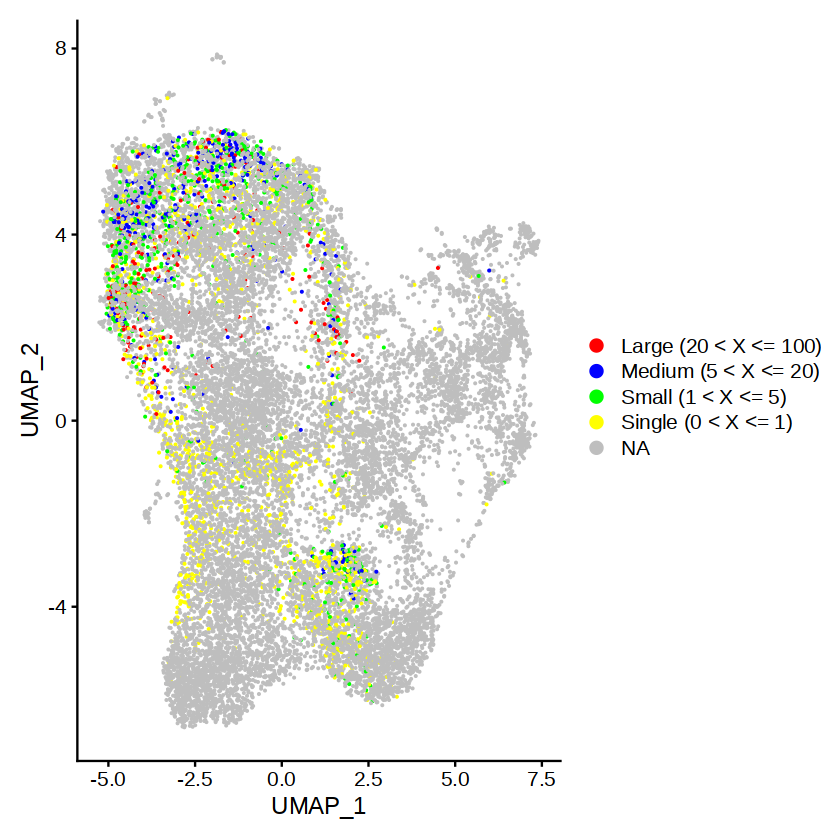

In [15]:
DimPlot(FT_data, group.by = "cloneType") +
    scale_color_manual(values = c("red","blue","green","yellow","orange"), na.value="grey") + 
  theme(plot.title = element_blank())

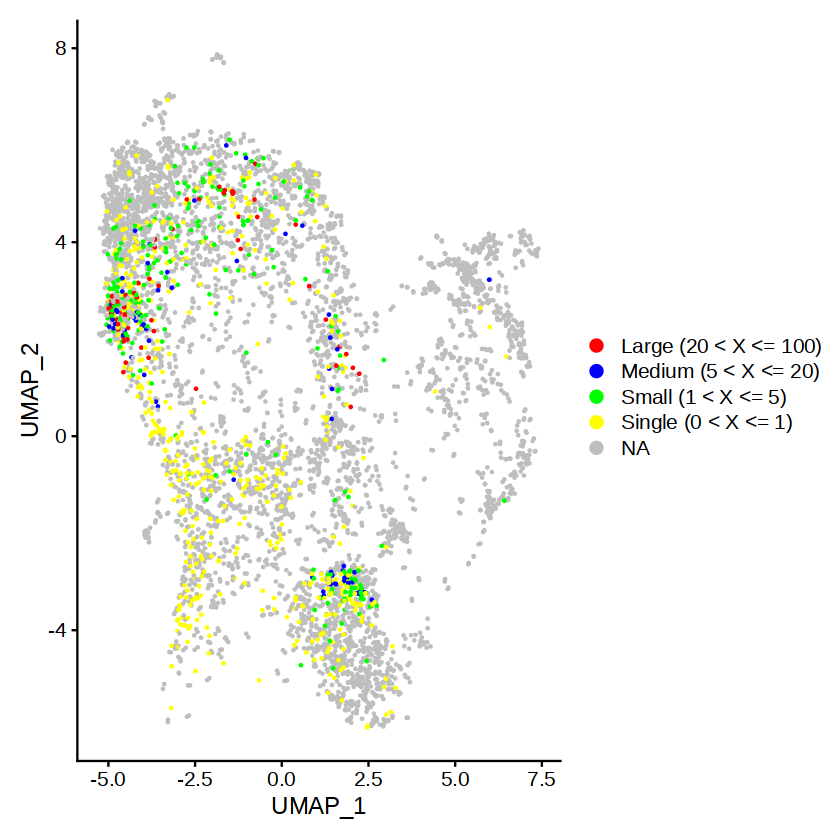

In [16]:
DimPlot(adenoma, group.by = "cloneType") +
    scale_color_manual(values = c("red","blue","green","yellow","orange"), na.value="grey") + 
  theme(plot.title = element_blank())

In [34]:
adenoma_cluster <- DimPlot(adenoma, group.by = "cloneType") +
    scale_color_manual(values = c("red","blue","green","yellow","orange"), na.value="grey") + 
  theme(plot.title = element_blank())
unique(adenoma_cluster$data$cloneType)
adenoma_cluster_large <- subset(adenoma_cluster$data, subset=cloneType=="Large (20 < X <= 100)")
adenoma_cluster_large

[1] <NA>                  Single (0 < X <= 1)   Small (1 < X <= 5)   
[4] Medium (5 < X <= 20)  Large (20 < X <= 100)
5 Levels: Hyperexpanded (100 < X <= 500) ... Single (0 < X <= 1)

,UMAP_1,UMAP_2,cloneType
,<dbl>,<dbl>,<fct>
FT2_TGGCGCAAGAGTAATC.1,-3.6612728,4.0579517,Large (20 < X <= 100)
FT2_ACGGCCATCTTGCATT.1,-3.1486009,4.2712781,Large (20 < X <= 100)
FT2_CACCTTGGTCATTAGC.1,-2.4741240,0.9783827,Large (20 < X <= 100)
FT2_TCAGGTAAGACTTTCG.1,-4.9237941,2.7824993,Large (20 < X <= 100)
FT2_TTGGAACCAAACTGCT.1,-1.6717597,5.0121684,Large (20 < X <= 100)
FT2_TCGGTAAAGGCCATAG.1,-4.9148606,2.4483875,Large (20 < X <= 100)
FT2_CCACCTATCAGGTTCA.1,-4.0484966,1.8269146,Large (20 < X <= 100)
FT2_GTAGGCCCACGTCTCT.1,-4.5692676,1.3211727,Large (20 < X <= 100)
FT2_ACGAGGATCTGTGCAA.1,-3.7592314,2.3914245,Large (20 < X <= 100)


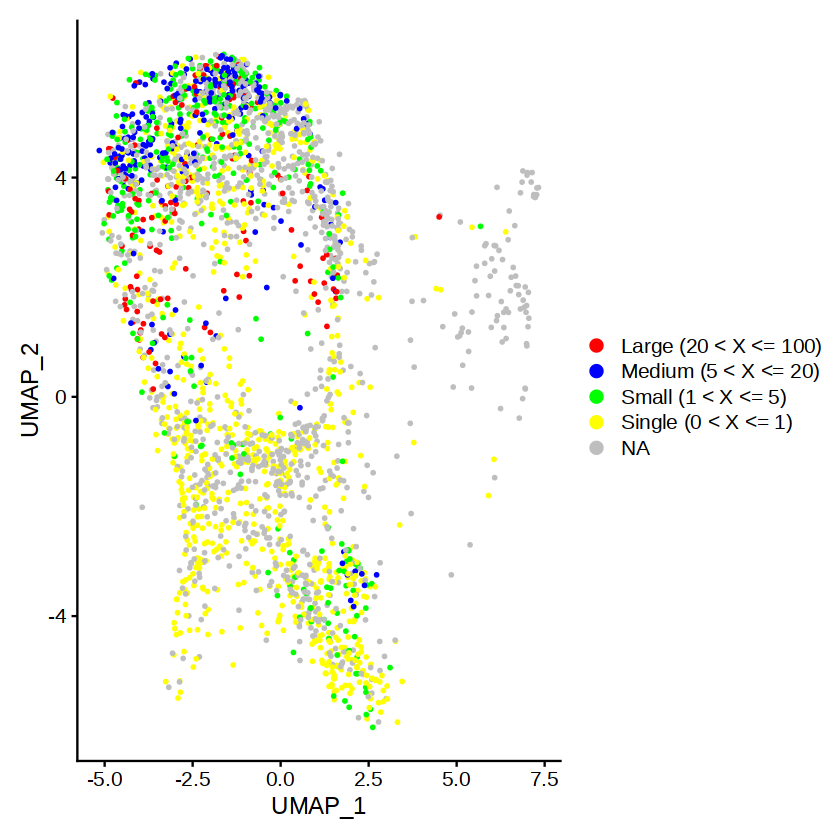

In [19]:
DimPlot(carcinoma, group.by = "cloneType") +
    scale_color_manual(values = c("red","blue","green","yellow","orange"), na.value="grey") + 
  theme(plot.title = element_blank())

In [33]:
carcinoma_cluster <- DimPlot(carcinoma, group.by = "cloneType") +
    scale_color_manual(values = c("red","blue","green","yellow","orange"), na.value="grey") + 
  theme(plot.title = element_blank())
unique(carcinoma_cluster$data$cloneType)
carcinoma_cluster_large <- subset(carcinoma_cluster$data, subset=cloneType=="Large (20 < X <= 100)")
carcinoma_cluster_large

[1] Single (0 < X <= 1)   <NA>                  Small (1 < X <= 5)   
[4] Medium (5 < X <= 20)  Large (20 < X <= 100)
5 Levels: Hyperexpanded (100 < X <= 500) ... Single (0 < X <= 1)

,UMAP_1,UMAP_2,cloneType
,<dbl>,<dbl>,<fct>
FT5_AGGGAGTCATGGTCTA.1,-0.8752015,4.077983,Large (20 < X <= 100)
FT5_CTGCTGTAGATGTGTA.1,-4.2353123,3.372764,Large (20 < X <= 100)
FT5_TACGGTAGTGCGGTAA.1,-1.0594449,3.571465,Large (20 < X <= 100)
FT5_CCTCTGAAGTCATCCA.1,-3.5085719,3.957475,Large (20 < X <= 100)
FT5_TATCTCACAAGACACG.1,-2.9675816,3.829588,Large (20 < X <= 100)
FT5_CGCGTTTGTCGGGTCT.1,-4.0323237,3.059470,Large (20 < X <= 100)
FT5_GGATTACTCTAACTCT.1,-3.3823910,1.145610,Large (20 < X <= 100)
FT5_ACATCAGTCAACACCA.1,-0.8891063,2.209525,Large (20 < X <= 100)
FT5_AGCGTATCAAGTCATC.1,-2.2717982,6.005259,Large (20 < X <= 100)


In [32]:
byumap1 <- merge(adenoma_cluster_large, carcinoma_cluster_large, by="UMAP_1")
byumap1
byumap2 <- merge(adenoma_cluster_large, carcinoma_cluster_large, by="UMAP_2")
byumap2

UMAP_1,UMAP_2.x,cloneType.x,UMAP_2.y,cloneType.y
<dbl>,<dbl>,<fct>,<dbl>,<fct>


UMAP_2,UMAP_1.x,cloneType.x,UMAP_1.y,cloneType.y
<dbl>,<dbl>,<fct>,<dbl>,<fct>


In [28]:
FT1 <- read.csv("/node200data/FTC/data/cellranger_multi_outs/FT1/outs/per_sample_outs/FT1/vdj_t/filtered_contig_annotations.csv")
FT2 <- read.csv("/node200data/FTC/data/cellranger_multi_outs/FT2/outs/per_sample_outs/FT2/vdj_t/filtered_contig_annotations.csv")
FT3 <- read.csv("/node200data/FTC/data/cellranger_multi_outs/FT3/outs/per_sample_outs/FT3/vdj_t/filtered_contig_annotations.csv")
FT4 <- read.csv("/node200data/FTC/data/cellranger_multi_outs/FT4/outs/per_sample_outs/FT4/vdj_t/filtered_contig_annotations.csv")
FT5 <- read.csv("/node200data/FTC/data/cellranger_multi_outs/FT5/outs/per_sample_outs/FT5/vdj_t/filtered_contig_annotations.csv")

contig_list <- list(FT1,FT2,FT3,FT4,FT5)

data(contig_list)

combined_contig_list <- combineTCR(contig_list,
                      samples = c("FT1","FT2","FT3","FT4","FT5"),
                      cells = "T-AB",
                      ID = c("a","a","a","c","c"),
                      removeNA = T,
                      removeMulti = T)

shared3_4 <- compareClonotypes(combined_contig_list, 
                  numbers = 1000000, 
                  samples = c("FT3_a", "FT4_c"), 
                  cloneCall="aa", 
                  graph = "alluvial",
                 exportTable=TRUE)

shared3 <- subset(shared3_4, subset=Sample=="FT3_a")
shared4 <- subset(shared3_4, subset=Sample=="FT4_c")
shared3
shared4
final_shared3_4 <- merge(shared3, shared4, by="Clonotypes")
final_shared3_4
nrow(final_shared3_4)

,Clonotypes,Proportion,Sample
,<fct>,<dbl>,<chr>
2593,CAAAGGGTSYGKLTF_CASSAGASPLHF,0.001490313,FT3_a
2594,CAAAKTSGSRLTF_CASSLVAAEQFF,0.001490313,FT3_a
2595,CAAANQAGTALIF_CASSSLSSDTQYF,0.001490313,FT3_a
2596,CAADSNAGKSTF_CASRKTVSVNGYTF,0.001490313,FT3_a
2597,CAAGGGADGLTF_CASSLGPGGYTF,0.001490313,FT3_a
2598,CAAGGTSYGKLTF_CASMDRRAINEKLFF,0.001490313,FT3_a
2599,CAAGIIF_CASSLISAGTGNEQYF,0.001490313,FT3_a
2600,CAAGLMYSGGGADGLTF_CASSVAHEQFF,0.001490313,FT3_a
2601,CAAGVETSGSRLTF_CSANQLQGSSYEQYF,0.001490313,FT3_a


,Clonotypes,Proportion,Sample
,<fct>,<dbl>,<chr>
3086,CAAAVGGGADGLTF_CASSPSGDYTF,0.0008196721,FT4_c
3087,CAADTGGFKTIF_CASRESYEQYF,0.0008196721,FT4_c
3088,CAAEDSGGGADGLTF_CASSEGIEYF,0.0008196721,FT4_c
3089,CAAGGKLIF_CATKGQGDEKLFF,0.0040983607,FT4_c
3090,CAAGPHFNKFYF_CASIGQDFYNEQFF,0.0008196721,FT4_c
3091,CAAGTNAGGTSYGKLTF_CASSPGHDTEAFF,0.0229508197,FT4_c
3092,CAAGTNAGGTSYGKLTF_CASSYDEGVTEAFF,0.0008196721,FT4_c
3093,CAAHAGMDSNYQLIW_CASSGAFYEQYF,0.0049180328,FT4_c
3094,CAAIISGNTGKLIF_CASSQIGQGNNEQFF,0.0008196721,FT4_c


Clonotypes,Proportion.x,Sample.x,Proportion.y,Sample.y
<fct>,<dbl>,<chr>,<dbl>,<chr>
CAAKKEGNMLTF_CASRETAIYEQYF,0.002980626,FT3_a,0.0008196721,FT4_c
CAALNQGGKLIF_CASSSEQGVINYGYTF,0.001490313,FT3_a,0.0024590164,FT4_c
CAANQAGTALIF_CASSHRLAGERDTQYF,0.001490313,FT3_a,0.0008196721,FT4_c
CAARRAGQKLLF_CASSEGMNTEAFF,0.001490313,FT3_a,0.0016393443,FT4_c
CAASAKETSGSRLTF_CASSRILITSGSPLHF,0.047690015,FT3_a,0.0098360656,FT4_c
CAASDPSYDKVIF_CASSLNRGLDTGELFF,0.001490313,FT3_a,0.0008196721,FT4_c
CAASEGYTGNQFYF_CASSFGTGSIEQYF,0.001490313,FT3_a,0.0008196721,FT4_c
CAESIDTDKLIF_CASKREVSYEQYF,0.001490313,FT3_a,0.0008196721,FT4_c
CAESPTDSWGKLQF_CASSLAGGPYNEQFF,0.001490313,FT3_a,0.0024590164,FT4_c


[1] 47

# clonalOverlay

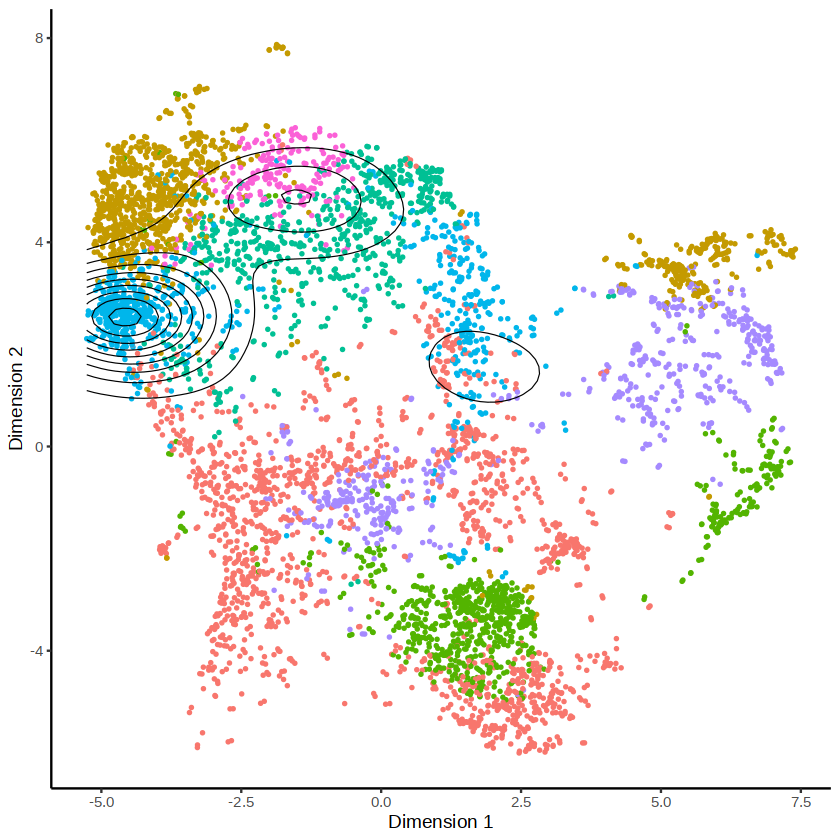

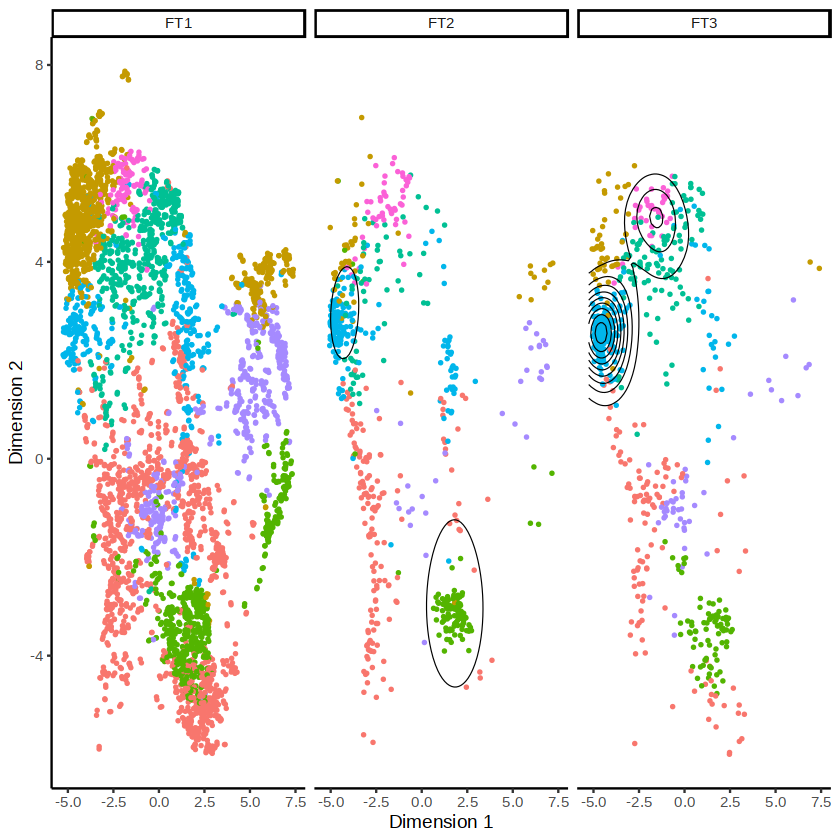

In [50]:
clonalOverlay(adenoma, 
              reduction = "umap", 
              freq.cutpoint = 20, 
              bins = 10,
             facet = NULL) + guides(color = "none")
clonalOverlay(adenoma, 
              reduction = "umap", 
              freq.cutpoint = 10, 
              bins = 10,
             facet = "orig.ident") + guides(color = "none")

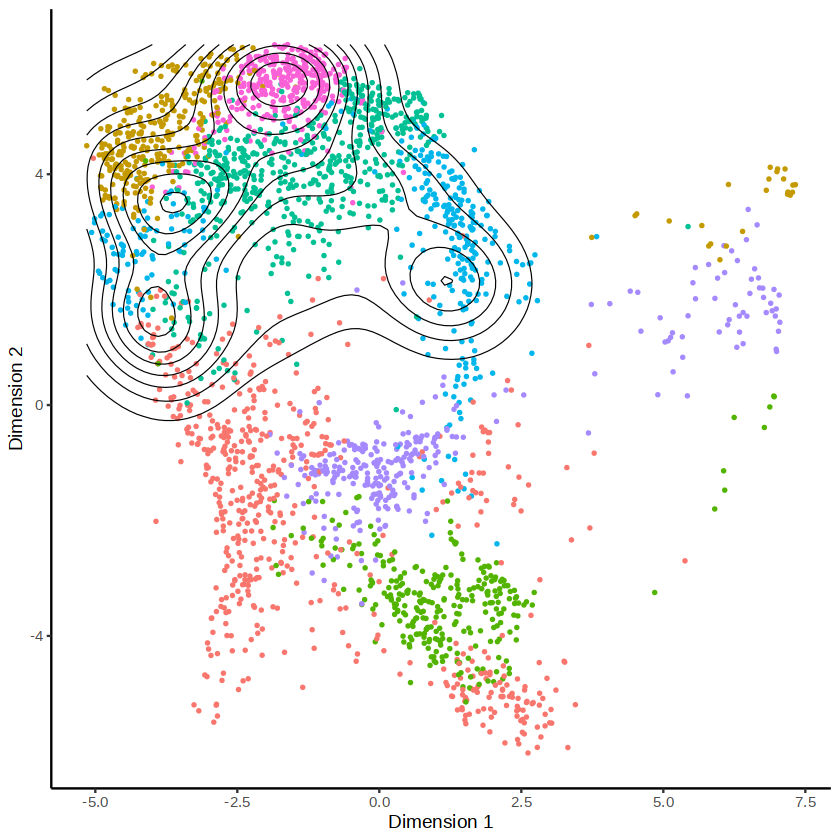

In [52]:
clonalOverlay(carcinoma, 
              reduction = "umap", 
              freq.cutpoint = 20, 
              bins = 10,
             facet = NULL) + guides(color = "none")

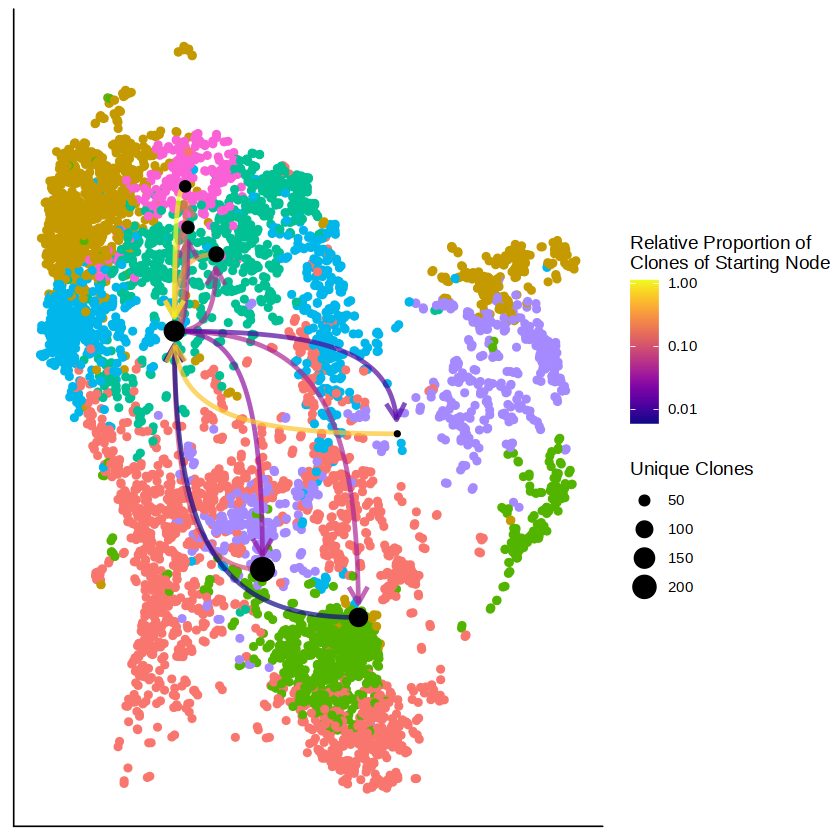

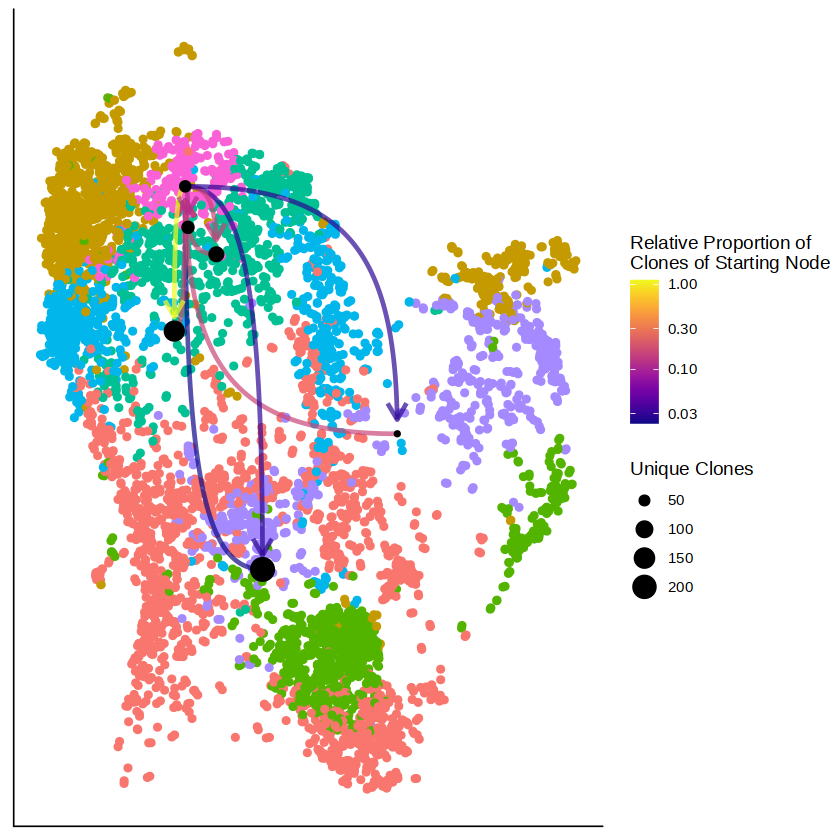

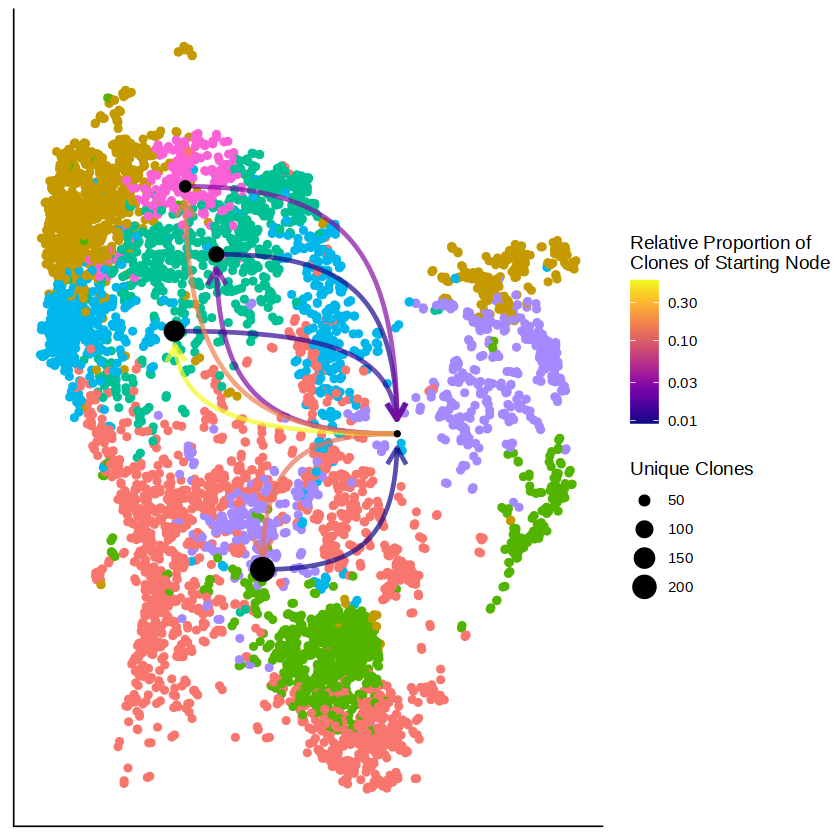

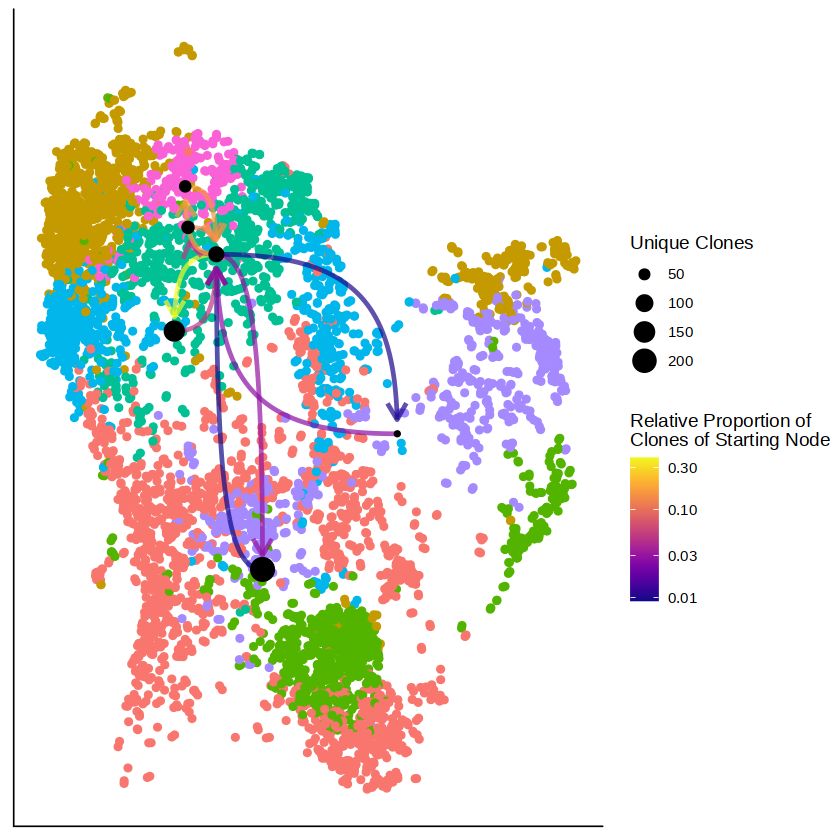

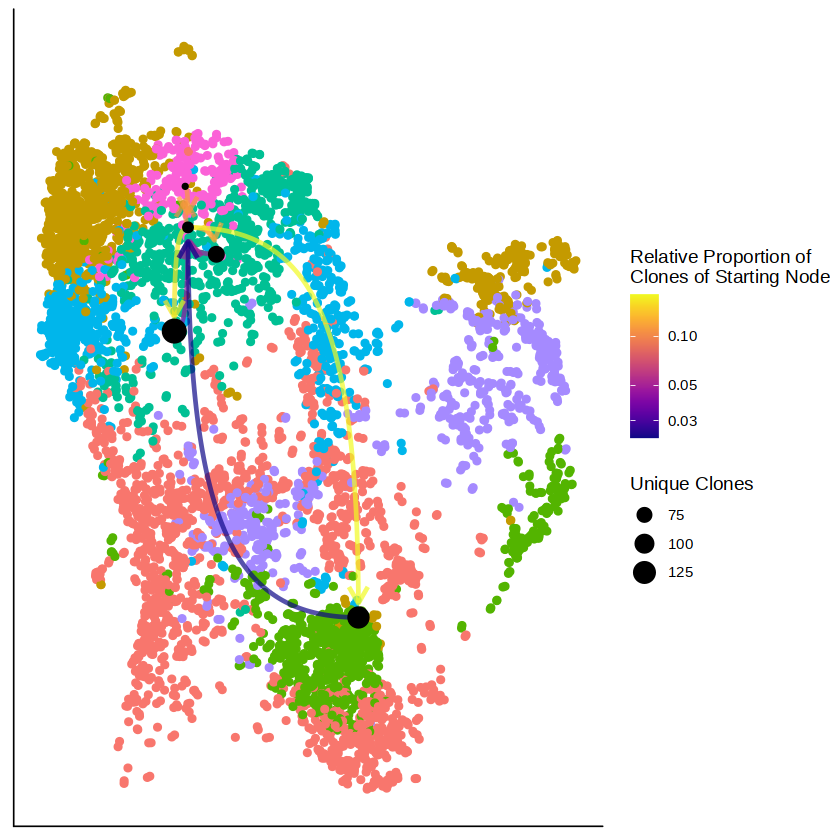

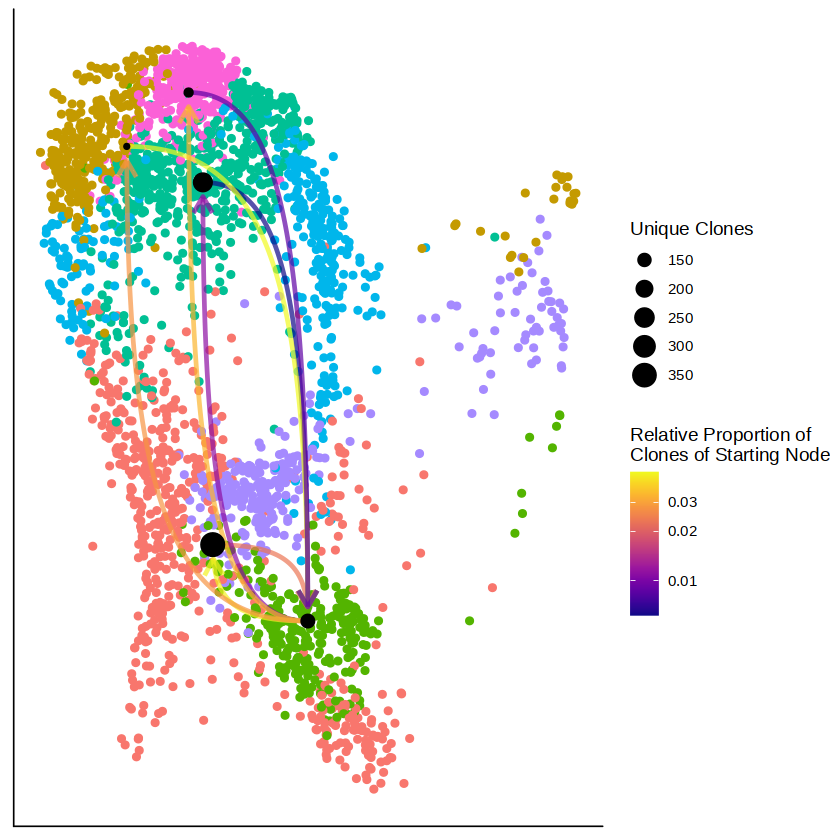

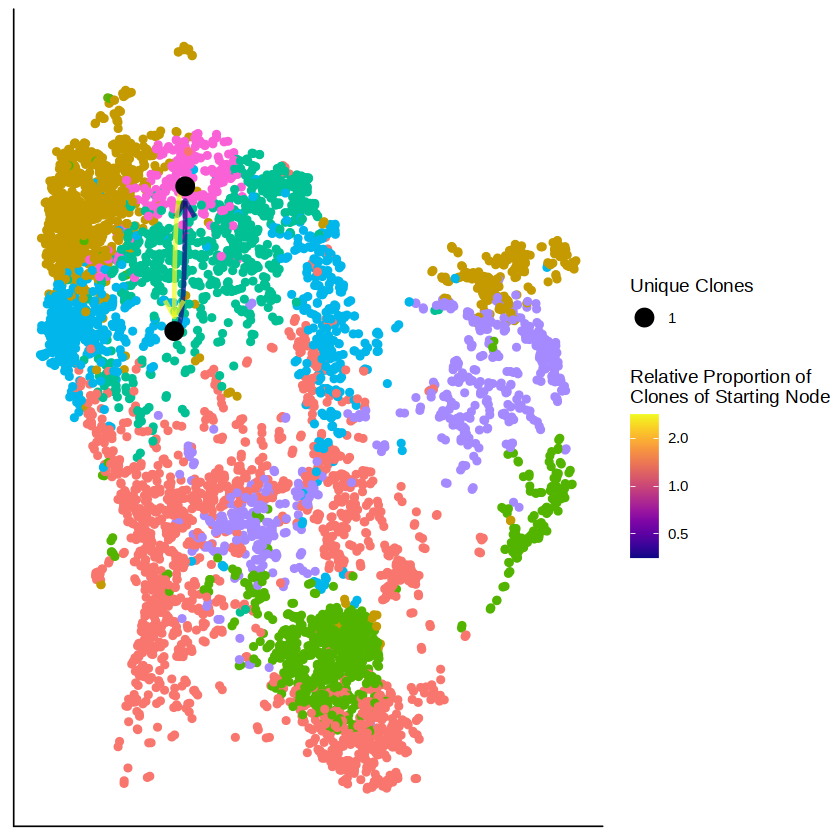

In [38]:
#ggraph needs to be loaded due to issues with ggplot
library(ggraph)

#No Identity filter
clonalNetwork(adenoma, 
              reduction = "umap", 
              identity = "ident",
              filter.clones = NULL,
              filter.identity = "TEM/TRM_like_CD8+",
              cloneCall = "aa")

clonalNetwork(adenoma, 
              reduction = "umap", 
              identity = "ident",
              filter.clones = NULL,
              filter.identity = "act_TRM/TEM_CD8+",
              cloneCall = "aa")

clonalNetwork(adenoma, 
              reduction = "umap", 
              identity = "ident",
              filter.clones = NULL,
              filter.identity = "act_CD4+T",
              cloneCall = "aa")

clonalNetwork(adenoma, 
              reduction = "umap", 
              identity = "ident",
              filter.clones = NULL,
              filter.identity = "CD8+CTL",
              cloneCall = "aa")

clonalNetwork(adenoma, 
              reduction = "umap", 
              identity = "ident",
              filter.clones = NULL,
              filter.identity = "TRM_like_CD4+/CD8+T",
              cloneCall = "aa")

clonalNetwork(carcinoma, 
              reduction = "umap", 
              identity = "ident",
              filter.clones = NULL,
              filter.identity = "Treg",
              cloneCall = "aa")

clonalNetwork(adenoma, 
              reduction = "umap", 
              identity = "ident",
              filter.clones = 10,
              filter.identity = NULL,
              cloneCall = "aa")

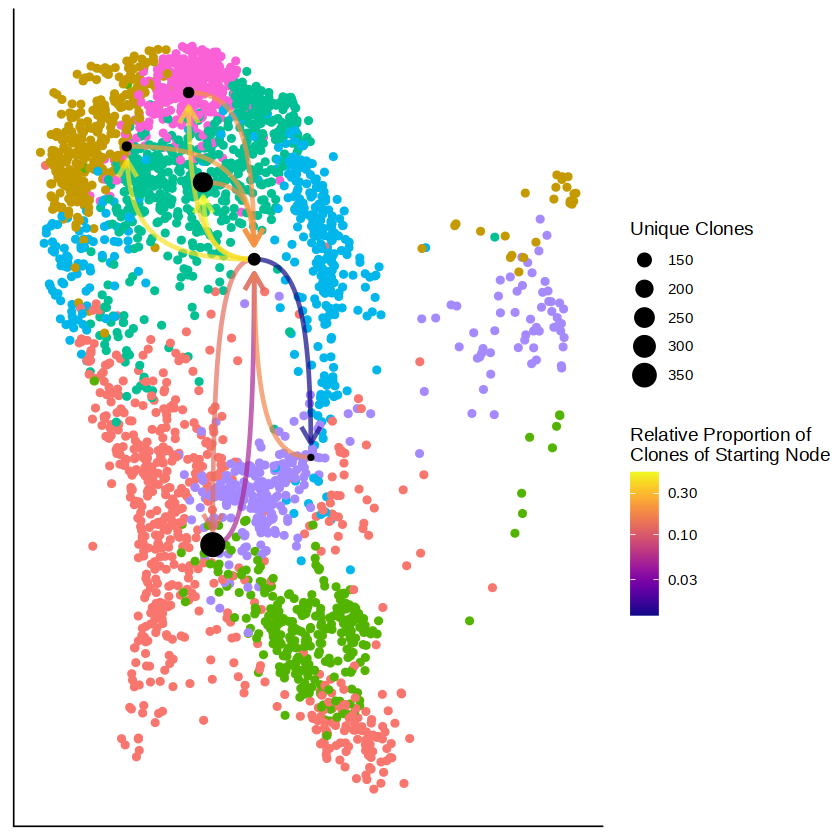

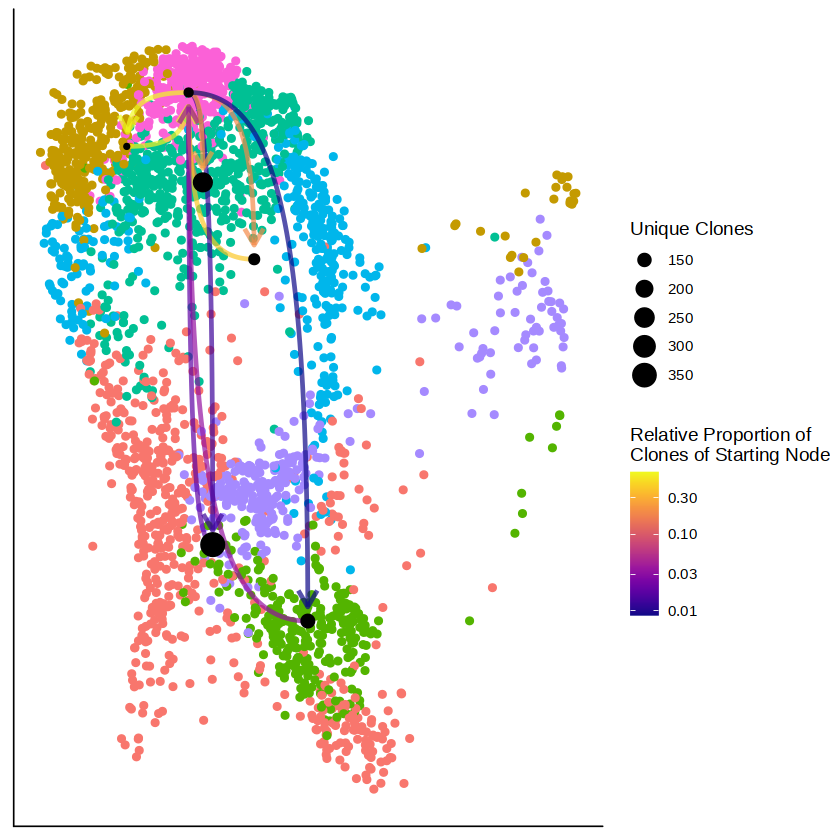

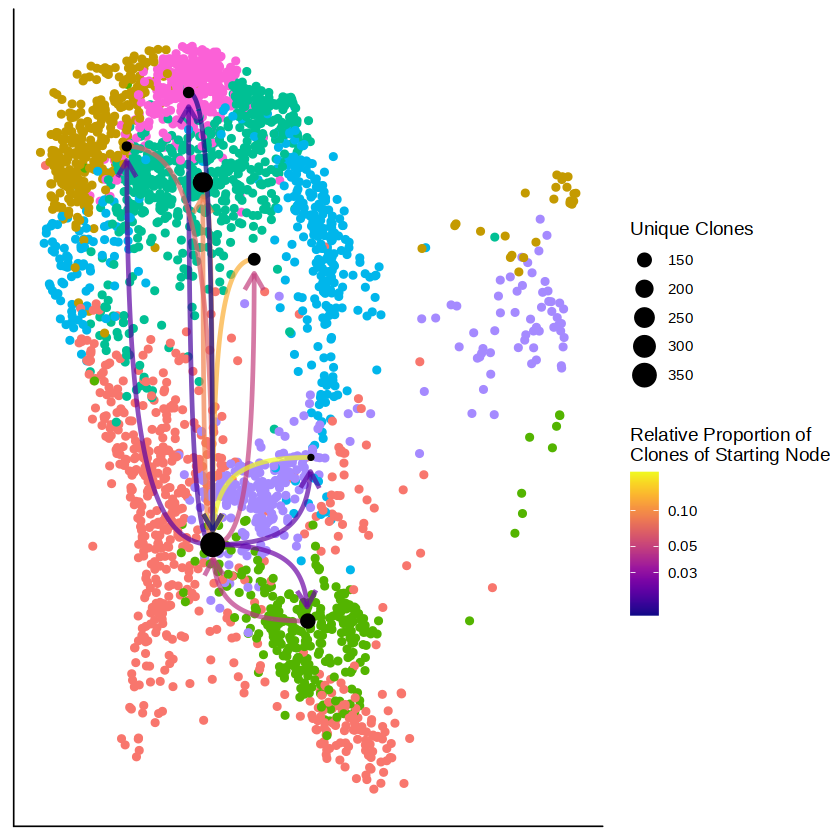

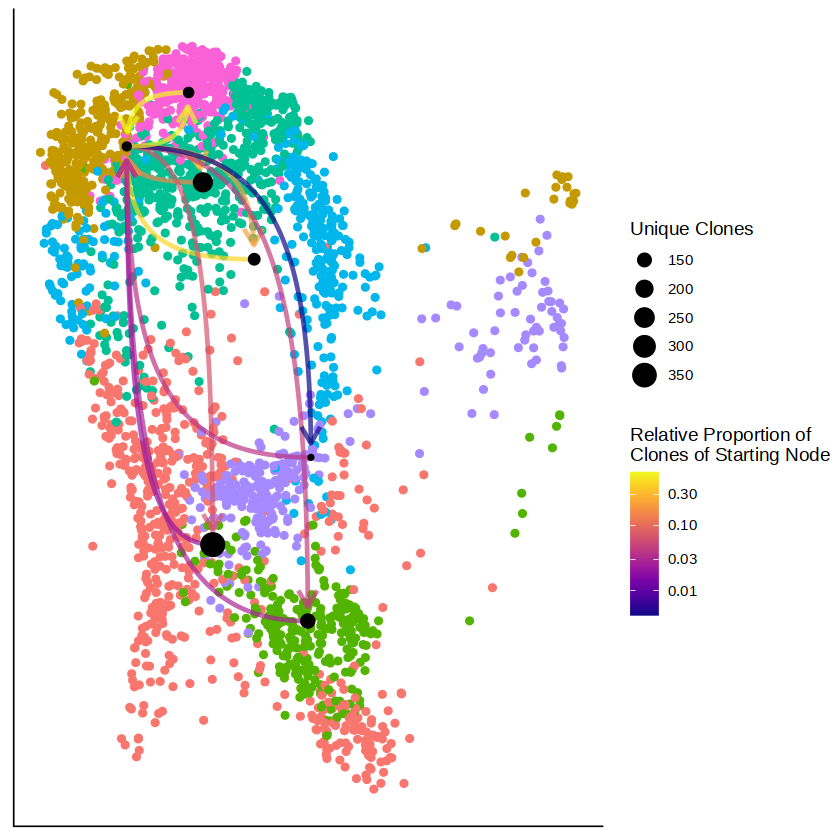

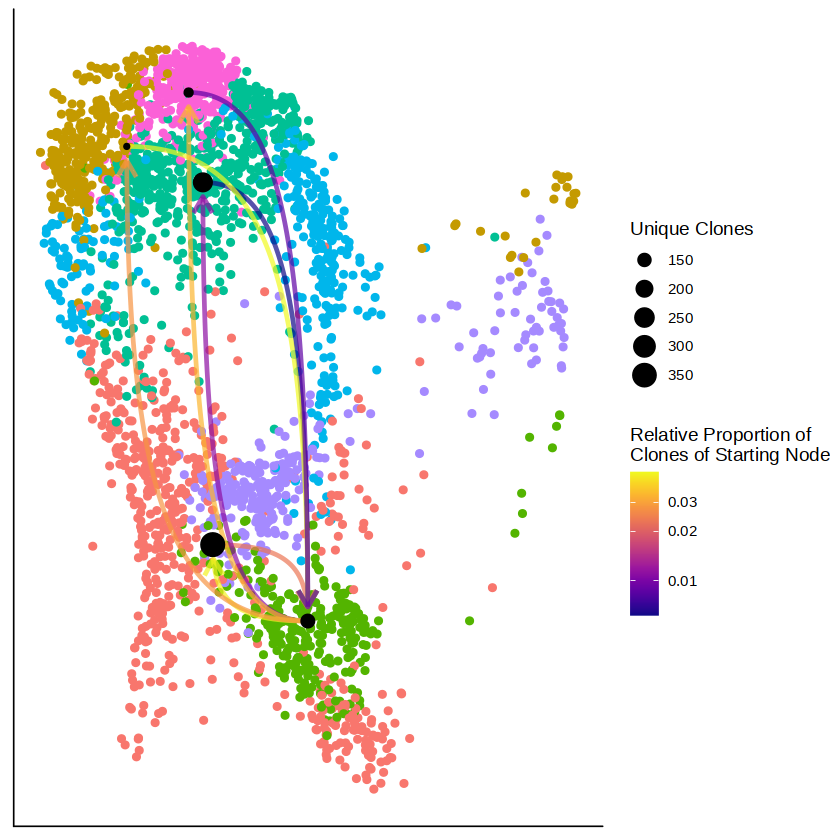

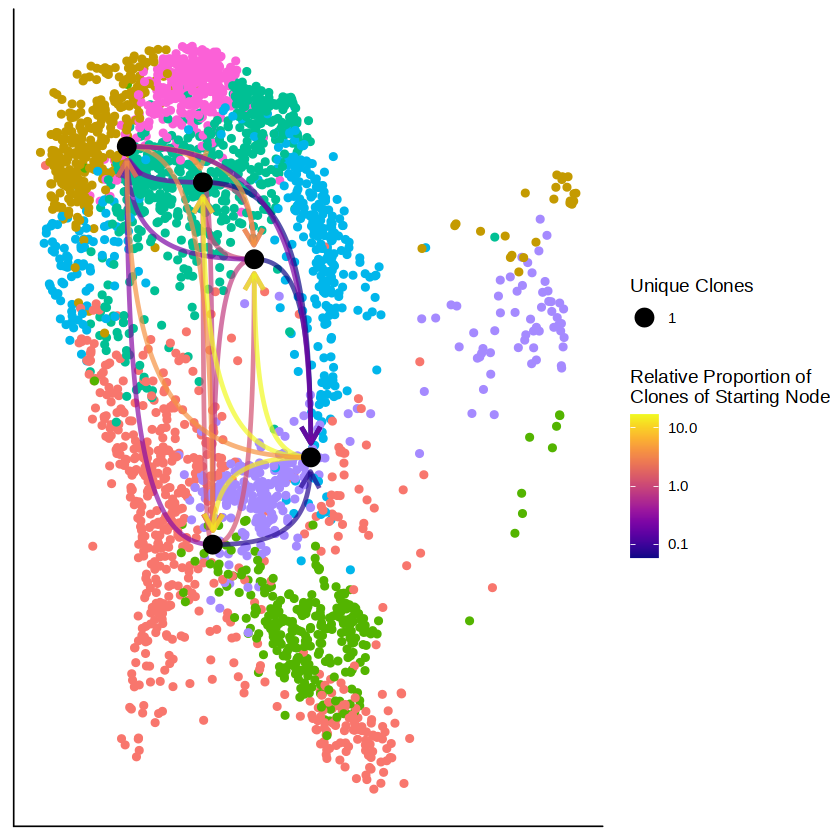

In [37]:
#ggraph needs to be loaded due to issues with ggplot
library(ggraph)

#No Identity filter
clonalNetwork(carcinoma, 
              reduction = "umap", 
              identity = "ident",
              filter.clones = NULL,
              filter.identity = "TEM/TRM_like_CD8+",
              cloneCall = "aa")

clonalNetwork(carcinoma, 
              reduction = "umap", 
              identity = "ident",
              filter.clones = NULL,
              filter.identity = "act_TRM/TEM_CD8+",
              cloneCall = "aa")

clonalNetwork(carcinoma, 
              reduction = "umap", 
              identity = "ident",
              filter.clones = NULL,
              filter.identity = "CD4+T",
              cloneCall = "aa")

clonalNetwork(carcinoma, 
              reduction = "umap", 
              identity = "ident",
              filter.clones = NULL,
              filter.identity = "TRM_like_CD4+/CD8+T",
              cloneCall = "aa")

clonalNetwork(carcinoma, 
              reduction = "umap", 
              identity = "ident",
              filter.clones = NULL,
              filter.identity = "Treg",
              cloneCall = "aa")

clonalNetwork(carcinoma, 
              reduction = "umap", 
              identity = "ident",
              filter.clones = 10,
              filter.identity = NULL,
              cloneCall = "aa")

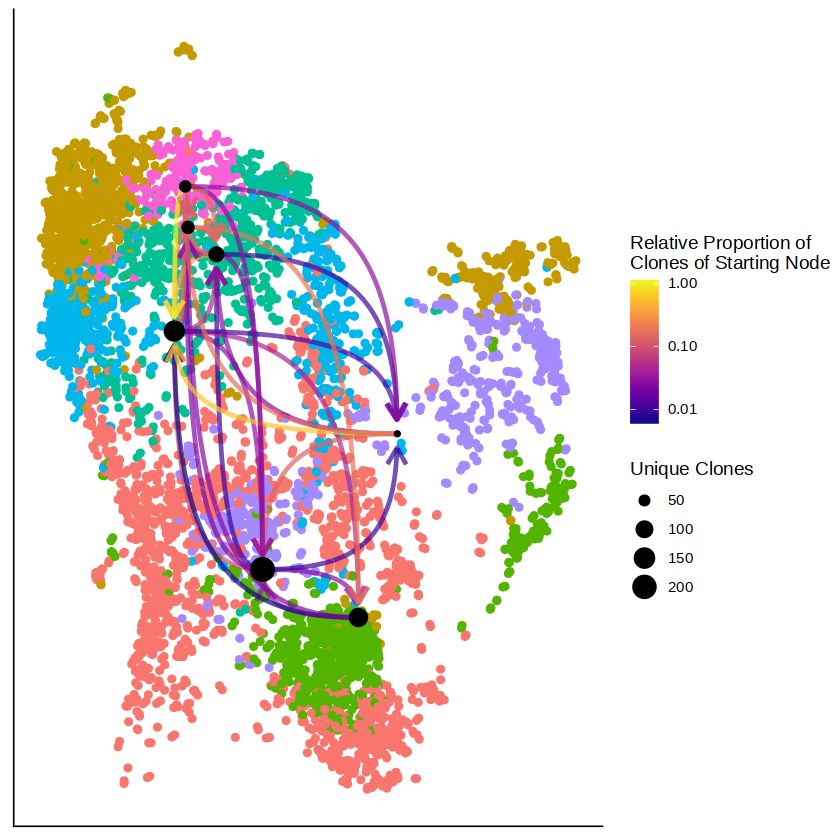

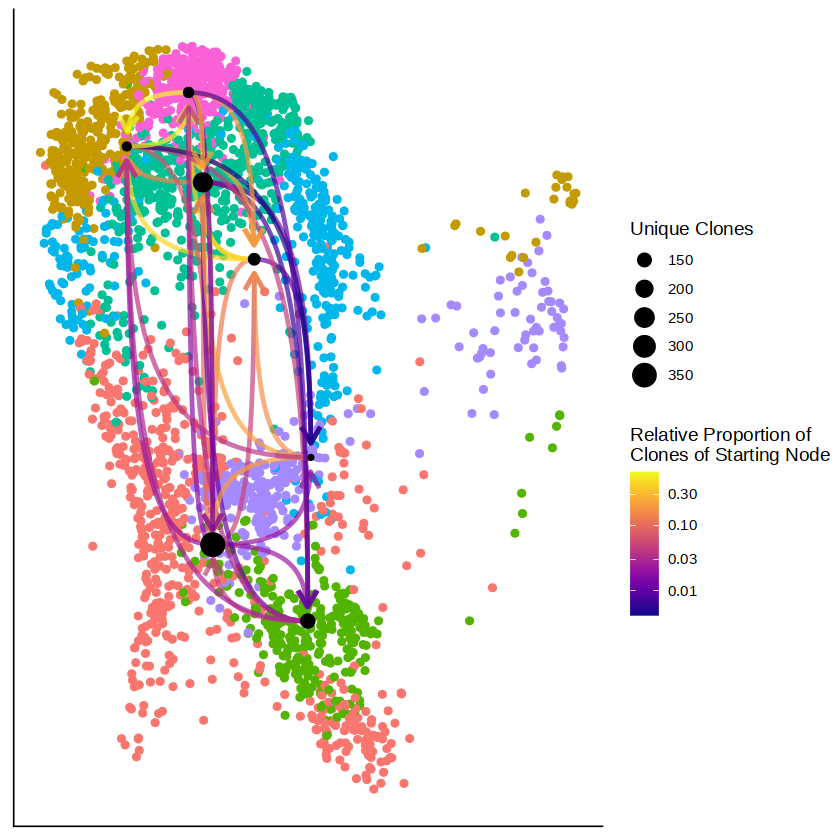

In [60]:
clonalNetwork(adenoma, 
              reduction = "umap", 
              identity = "ident",
              filter.clones = NULL,
              filter.identity = NULL,
              cloneCall = "aa")
clonalNetwork(carcinoma, 
              reduction = "umap", 
              identity = "ident",
              filter.clones = NULL,
              filter.identity = NULL,
              cloneCall = "aa")

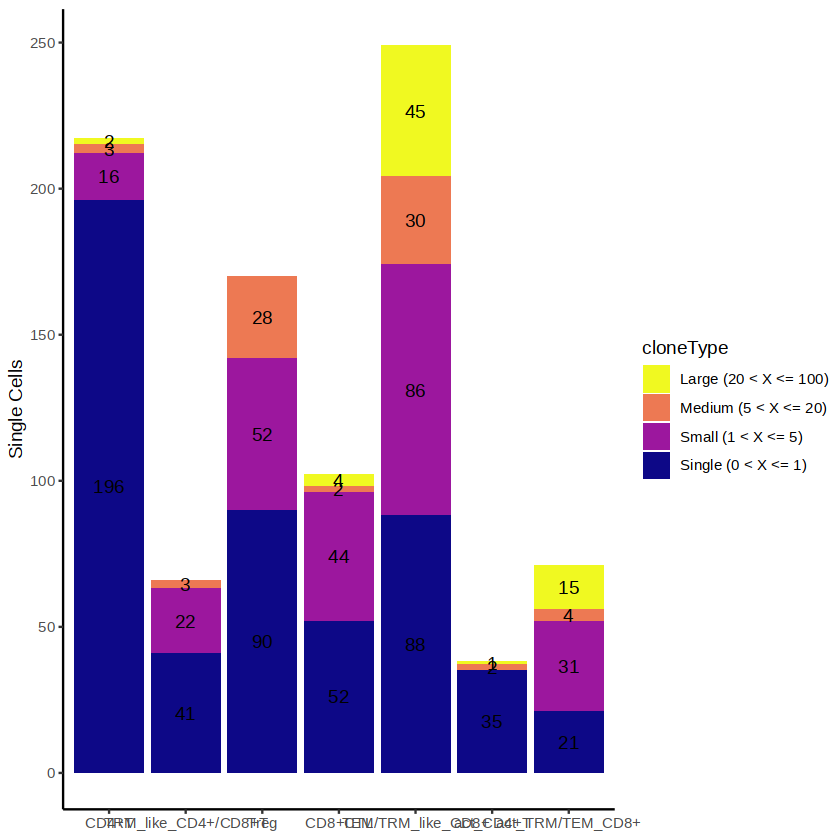

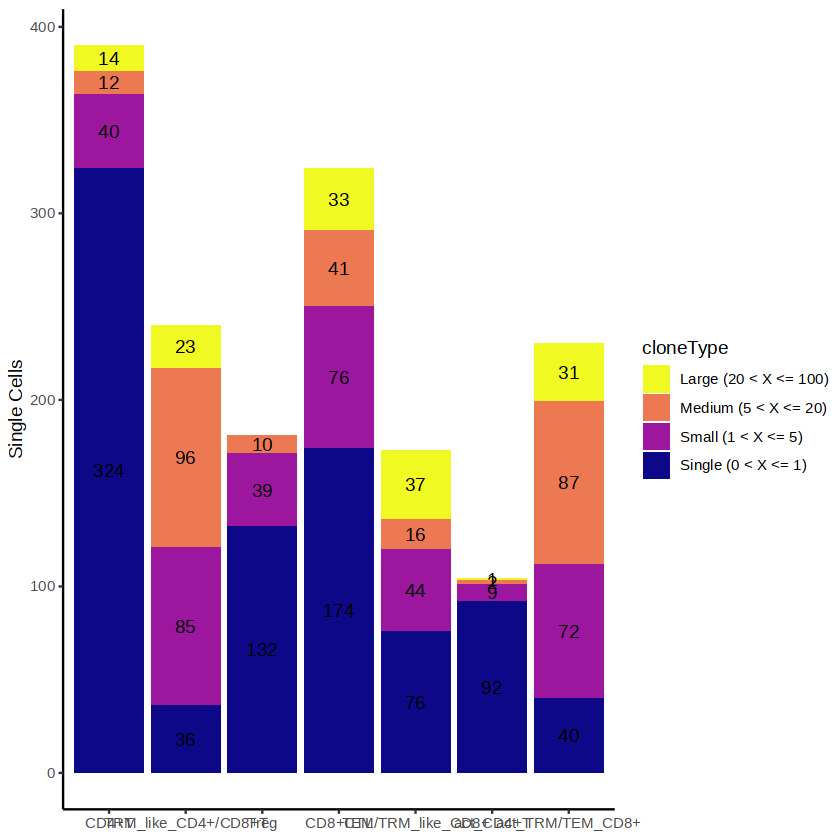

In [50]:
occupiedscRepertoire(adenoma, x.axis = "ident")
occupiedscRepertoire(carcinoma, x.axis = "ident")

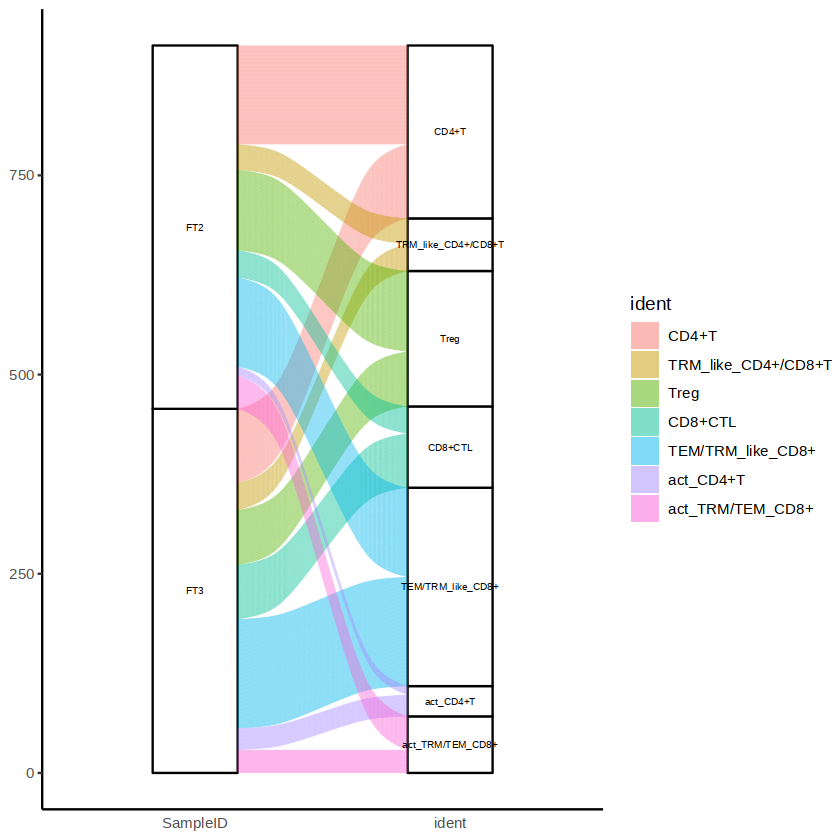

In [52]:
alluvialClonotypes(adenoma, cloneCall = "gene", 
                   y.axes = c("SampleID", "ident"), 
                   color = "ident") 

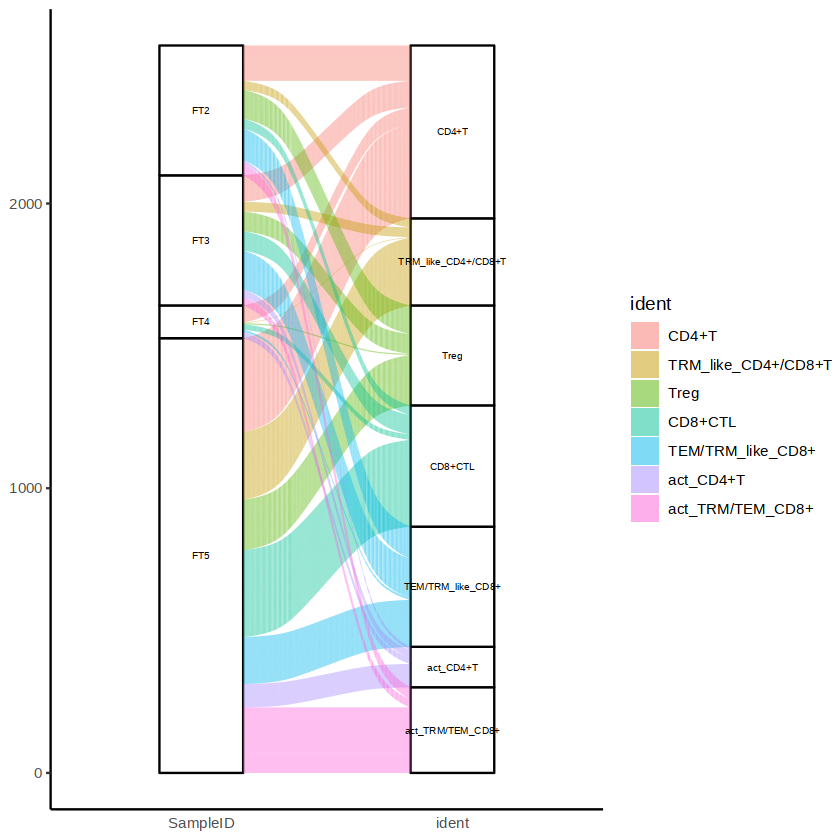

In [58]:
alluvialClonotypes(FT_data, cloneCall = "gene", 
                   y.axes = c("SampleID", "ident"), 
                   color = "ident") 

In [15]:
install.packages("ggplot2")

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



In [4]:
library(pheatmap)

In [3]:
install.packages("pheatmap")

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



In [15]:
head(FT_data)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,SampleID,tissue_type,nCount_SCT,nFeature_SCT,SCT_snn_res.1,seurat_clusters,barcode,CTgene,CTnt,CTaa,CTstrict,Frequency,cloneType
,<chr>,<dbl>,<int>,<dbl>,<chr>,<chr>,<dbl>,<int>,<fct>,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>
FT1_CAGCATAGTGTAAGTA.1_1,FT1,9908,3799,1.1909568,FT1,tumor,5029,2950,4,4,NA,NA,NA,NA,NA,NA,NA
FT1_CTCACACGTAAGTAGT.1_1,FT1,9600,3326,1.1979167,FT1,tumor,4930,2617,13,13,NA,NA,NA,NA,NA,NA,NA
FT1_CATTATCGTAGCTTGT.1_1,FT1,9407,3298,0.8185394,FT1,tumor,4999,2671,1,1,NA,NA,NA,NA,NA,NA,NA
FT1_CAGTAACCAAAGGAAG.1_1,FT1,9365,3361,1.6123865,FT1,tumor,5028,2800,4,4,NA,NA,NA,NA,NA,NA,NA
FT1_TTAGGCAAGCGTCAAG.1_1,FT1,9348,3518,1.3585794,FT1,tumor,5018,2918,3,3,NA,NA,NA,NA,NA,NA,NA
FT1_ATGAGGGAGTTTCCTT.1_1,FT1,9168,2883,1.3743455,FT1,tumor,4883,2320,14,14,NA,NA,NA,NA,NA,NA,NA
FT1_AGTGTCACAGCTGTGC.1_1,FT1,9101,3109,1.0658169,FT1,tumor,4973,2606,1,1,NA,NA,NA,NA,NA,NA,NA
FT1_TTGTAGGGTGCGGTAA.1_1,FT1,9013,3204,1.1649839,FT1,tumor,5067,2763,4,4,NA,NA,NA,NA,NA,NA,NA
FT1_CACAGGCTCTTGGGTA.1_1,FT1,8982,3071,0.7793365,FT1,tumor,4974,2614,7,7,NA,NA,NA,NA,NA,NA,NA


In [16]:
dim(FT_data)

[1] 22989 18307

In [17]:
data <- FT_data[1:200,]

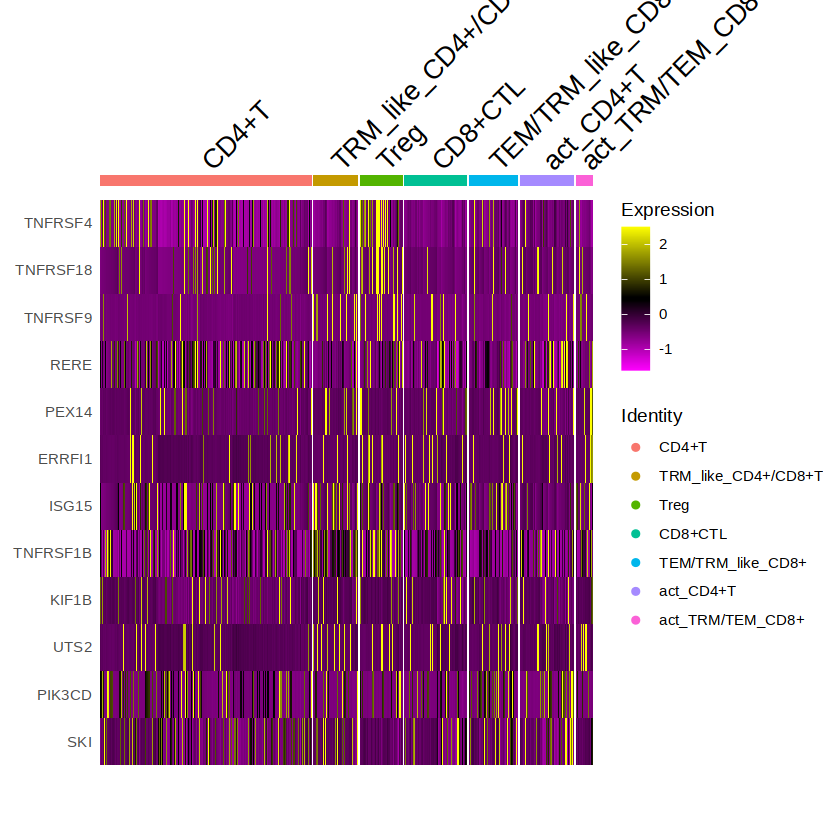

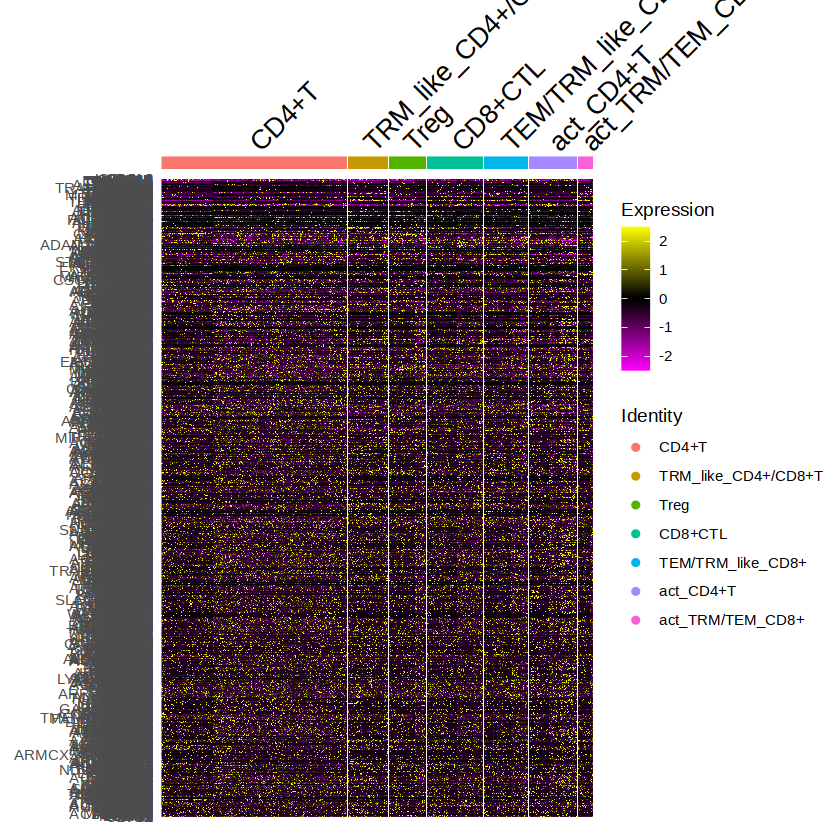

In [21]:
DoHeatmap(data)
DoHeatmap(FT_data)